In [70]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from pprint import pprint as pp

pd.set_option('display.max_columns', None)

In [71]:
df = pd.read_csv('../OXFORD_latest_daily_columns.csv', parse_dates=["Date"])

In [72]:
print(df.shape)

(28793, 44)


In [73]:
df.head()

,CountryName,Date,CountryCode,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,E1_Income support,E1_Flag,E2_Debt/contract relief,E3_Fiscal measures,E4_International support,H1_Public information campaigns,H1_Flag,H2_Testing policy,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,StringencyLegacyIndex,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay,NewConfirmedCases,NewConfirmedDeaths
0,Afghanistan,2020-01-01,AFG,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
1,Afghanistan,2020-01-02,AFG,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Afghanistan,2020-01-03,AFG,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Afghanistan,2020-01-04,AFG,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Afghanistan,2020-01-05,AFG,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [74]:
df.nunique(axis=0)

CountryName                               176
Date                                      165
CountryCode                               176
C1_School closing                           4
C1_Flag                                     2
C2_Workplace closing                        4
C2_Flag                                     2
C3_Cancel public events                     3
C3_Flag                                     2
C4_Restrictions on gatherings               5
C4_Flag                                     2
C5_Close public transport                   3
C5_Flag                                     2
C6_Stay at home requirements                4
C6_Flag                                     2
C7_Restrictions on internal movement        3
C7_Flag                                     2
C8_International travel controls            5
E1_Income support                           3
E1_Flag                                     2
E2_Debt/contract relief                     3
E3_Fiscal measures                

In [75]:
df.CountryName.unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Argentina', 'Aruba', 'Australia', 'Austria', 'Azerbaijan',
       'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium',
       'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei',
       'Bulgaria', 'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon',
       'Canada', 'Cape Verde', 'Central African Republic', 'Chad',
       'Chile', 'China', 'Colombia', 'Congo', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czech Republic',
       'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica',
       'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Gibraltar',
       'Greece', 'Greenland', 'Guam', 'Guatemala', 'Guinea', 'Guyana',
       'Haiti', 'Honduras', 'Hong Kong', 'Hungary'

In [76]:
df.describe().apply(lambda s: s.apply(lambda x: format(x, 'f')))

,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,E1_Income support,E1_Flag,E2_Debt/contract relief,E3_Fiscal measures,E4_International support,H1_Public information campaigns,H1_Flag,H2_Testing policy,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,StringencyLegacyIndex,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay,NewConfirmedCases,NewConfirmedDeaths
count,27937.000000,14559.000000,27891.000000,13040.000000,27894.000000,14925.000000,27900.000000,13123.000000,27893.000000,9552.000000,27921.000000,11801.000000,27916.000000,12001.000000,27757.000000,27776.000000,8192.000000,27927.000000,27535.000000,27863.000000,27764.000000,19680.000000,27855.000000,27911.000000,27518.000000,27847.000000,0.000000,28793.000000,28793.000000,27734.000000,28382.000000,27734.000000,28382.000000,27718.000000,28373.000000,27721.000000,28375.000000,27722.000000,28360.000000,28617.000000,28617.000000
mean,1.495078,0.924926,1.064286,0.824233,1.027820,0.912965,1.625986,0.909243,0.522353,0.766855,0.760431,0.809084,0.764938,0.701275,2.141442,0.410822,0.571899,0.535503,372422097.194742,31540873.742146,1.338784,0.987703,0.955986,0.832897,21527371.185192,297716.498851,nan,10168.105130,648.309103,41.854381,42.426372,46.141962,46.776773,38.023206,38.622982,40.951664,41.554281,22.030337,22.586830,260.470350,14.696195
std,1.459402,0.263519,1.220973,0.380636,0.978242,0.281896,1.798699,0.287274,0.780593,0.422856,0.988192,0.393040,0.921911,0.457718,1.712835,0.688366,0.494834,0.797353,16896795802.067940,5002646759.981538,0.897984,0.110210,0.931564,0.853274,1671300262.461079,15054655.875167,nan,72709.495691,4767.335006,36.466967,36.346978,38.310411,38.183732,32.337011,32.272230,34.292421,34.202994,31.263804,31.453880,1687.787015,110.017821
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,nan,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-2461.000000,-1918.000000
25%,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,nan,0.000000,0.000000,0.000000,2.780000,0.000000,3.570000,2.560000,3.850000,3.030000,4.550000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,3.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,0.000000,0.000000,nan,16.000000,0.000000,41.670000,43.520000,51.900000,53.570000,39.100000,41.670000,43.180000,44.700000,0.000000,0.000000,0.000000,0.000000
75%,3.000000,1.000000,2.000000,1.000000,2.000000,1.000000,4.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.000000,0.000000,2.000000,1.000000,2.000000,2.000000,0.000000,0.000000,nan,937.000000,18.000000,78.700000,78.700000,83.330000,83.330000,69.550000,69.870000,75.000000,75.000000,50.000000,50.000000,25.000000,0.000000
max,3.000000,1.000000,3.000000,1.000000,2.000000,1.000000,4.000000,1.000000,2.000000,1.000000,3.000000,1.000000,2.000000,1.000000,4.000000,2.000000,1.000000,2.000000,1957600000000.000000,834353000000.000000,2.000000,1.000000,3.000000,2.000000,242400000000.000000,139000000

In [77]:
# df.sort_values(['CountryName', 'Date'], inplace=True)
# df['NewConfirmedCases'] = df['ConfirmedCases'].diff()
# df["NewConfirmedDeaths"] = df["ConfirmedDeaths"].diff()
# mask = df.CountryName != df.CountryName.shift(1)
# df['NewConfirmedCases'][mask] = np.nan
# df['NewConfirmedDeaths'][mask] = np.nan


# df.to_csv('NewDailyCases.csv', index=False)

<ipython-input-78-7c19554936e4>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



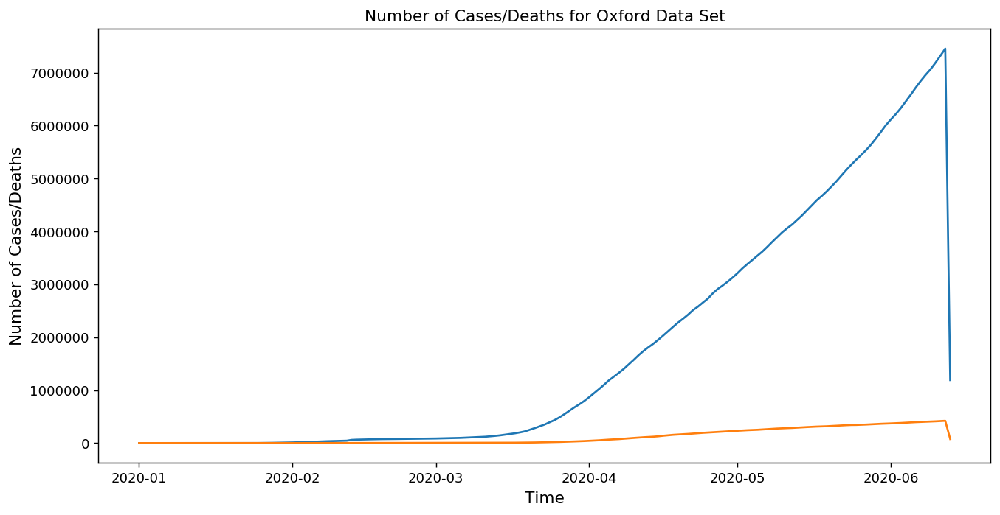

In [78]:
num_cases = df.groupby('Date', as_index=False)['ConfirmedCases', 'ConfirmedDeaths'].sum()
plt.figure(figsize=(12,6), dpi = 130)
plt.xlabel('Time', fontsize = 12)
plt.ylabel('Number of Cases/Deaths', fontsize = 12)
plt.title('Number of Cases/Deaths for Oxford Data Set')
plt.plot('Date', 'ConfirmedCases', data=num_cases)
plt.plot('Date', 'ConfirmedDeaths', data=num_cases)
plt.show()

In [79]:
selected_country = 'United States'
country_df = df.loc[df['CountryName'] == selected_country]

In [80]:
country_df

,CountryName,Date,CountryCode,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,E1_Income support,E1_Flag,E2_Debt/contract relief,E3_Fiscal measures,E4_International support,H1_Public information campaigns,H1_Flag,H2_Testing policy,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,StringencyLegacyIndex,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay,NewConfirmedCases,NewConfirmedDeaths
27318,United States,2020-01-01,USA,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,NaN,NaN
27319,United States,2020-01-02,USA,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0
27320,United States,2020-01-03,USA,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0
27321,United States,2020-01-04,USA,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0
27322,United States,2020-01-05,USA,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27477,United States,2020-06-08,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1942363,110514,NaN,72.69,NaN,72.14,NaN,71.47,NaN,73.11,NaN,62.5,22302.0,712.0
27478,United States,2020-06-09,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1961185,111007,NaN,72.69,NaN,72.14,NaN,71.47,NaN,73.11,NaN,62.5,18822.0,493.0
27479,United States,2020-06-10,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979850,112006,NaN,72.69,NaN,72.14,NaN,71.47,NaN,73.11,NaN,62.5,18665.0,999.0
27480,United States,2020-06-11,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000464,112924,NaN,72.69,NaN,72.14,NaN,71.47,NaN,73.11,NaN,62.5,20614.0,918.0


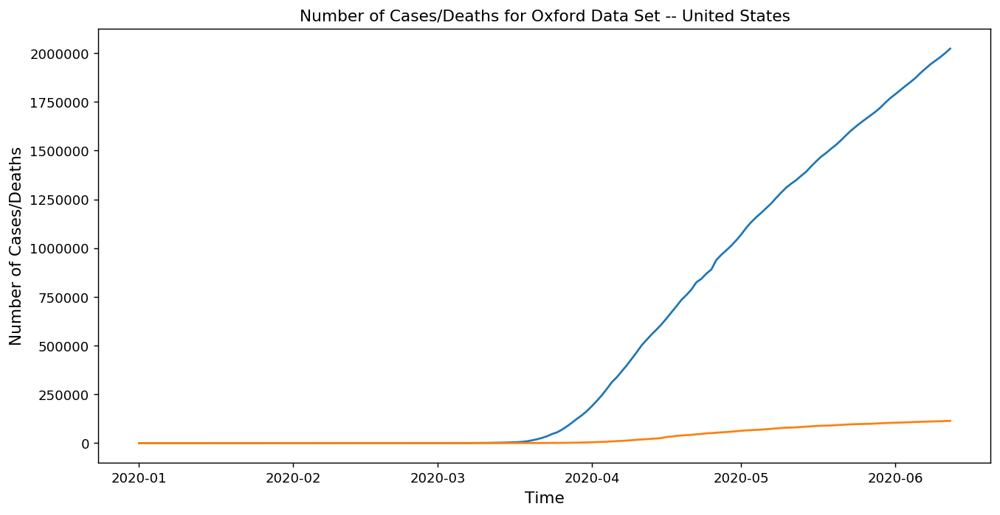

In [81]:
plt.figure(figsize=(12,6), dpi = 130)
plt.xlabel('Time', fontsize = 12)
plt.ylabel('Number of Cases/Deaths', fontsize = 12)
plt.title('Number of Cases/Deaths for Oxford Data Set -- {}'.format(selected_country))
plt.plot('Date', 'ConfirmedCases', data = country_df)
plt.plot('Date', 'ConfirmedDeaths', data = country_df)
plt.show()

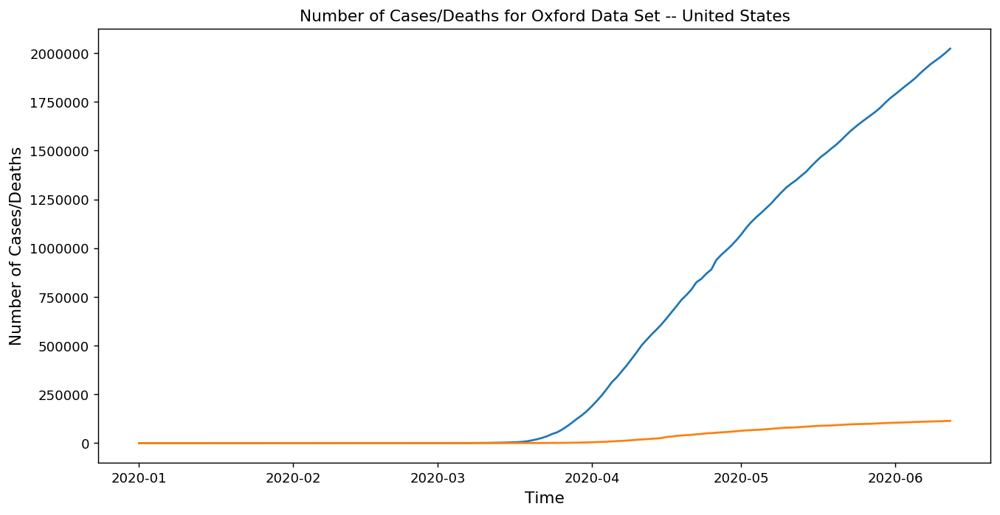

In [82]:
plt.figure(figsize=(12,6), dpi = 130)
plt.xlabel('Time', fontsize = 12)
plt.ylabel('Number of Cases/Deaths', fontsize = 12)
plt.title('Number of Cases/Deaths for Oxford Data Set -- {}'.format(selected_country))
plt.plot('Date', 'ConfirmedCases', data = country_df)
plt.plot('Date', 'ConfirmedDeaths', data = country_df)
plt.show()

In [104]:
control_requirements = ['C1_School closing', 'C2_Workplace closing', 'C3_Cancel public events', 'C4_Restrictions on gatherings', 'C5_Close public transport', 'C6_Stay at home requirements', 'C7_Restrictions on internal movement', 'C8_International travel controls']
health_requirements = ['H1_Public information campaigns', 'H2_Testing policy', 'H3_Contact tracing', 'H4_Emergency investment in healthcare', 'H5_Investment in vaccines']
fiscal_flags = ['E1_Income support', 'E2_Debt/contract relief', 'E3_Fiscal measures', 'E4_International support']
display_index = ['GovernmentResponseIndex', 'ContainmentHealthIndex','EconomicSupportIndex']

key_metrics = ['Date', 'ConfirmedCases', 'ConfirmedDeaths']

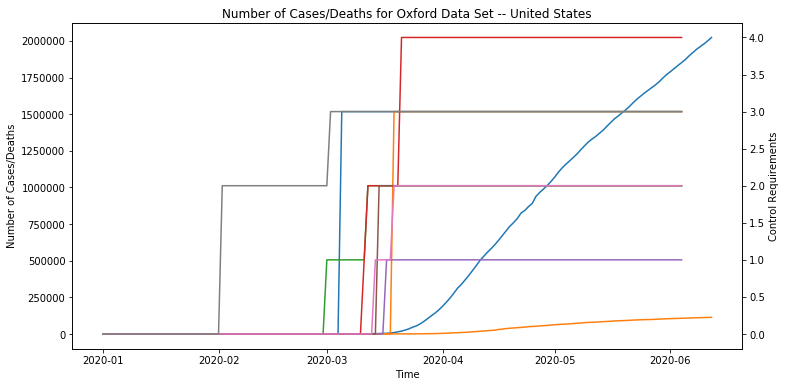

In [105]:
country_control_df = country_df.loc[:, control_requirements + key_metrics]
handles = []

fig, ax1 = plt.subplots(figsize=(12,6))

handles.append(ax1.plot('Date', 'ConfirmedCases', data = country_df, label='ConfirmedCases'))
handles.append(ax1.plot('Date', 'ConfirmedDeaths', data = country_df, label='ConfirmedDeaths'))
ax2 = ax1.twinx()

for req in control_requirements:
    handles.append(ax2.plot('Date', req, data = country_control_df, label=req))

ax1.set_xlabel('Time')
ax1.set_ylabel('Number of Cases/Deaths')
ax2.set_ylabel('Control Requirements')
plt.title('Number of Cases/Deaths for Oxford Data Set -- {}'.format(selected_country))
# plt.legend(handles=handles)

plt.show()

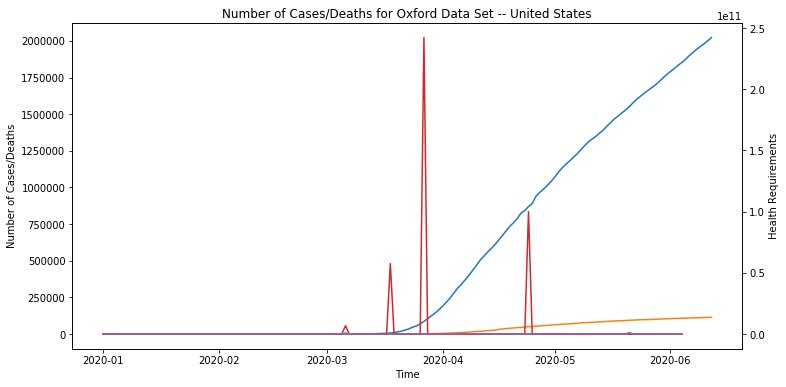

In [106]:
country_control_df = country_df.loc[:, health_requirements + key_metrics]
handles = []

fig, ax1 = plt.subplots(figsize=(12,6))

handles.append(ax1.plot('Date', 'ConfirmedCases', data = country_df, label='ConfirmedCases'))
handles.append(ax1.plot('Date', 'ConfirmedDeaths', data = country_df, label='ConfirmedDeaths'))
ax2 = ax1.twinx()

for req in health_requirements:
    handles.append(ax2.plot('Date', req, data = country_control_df, label=req))

ax1.set_xlabel('Time')
ax1.set_ylabel('Number of Cases/Deaths')
ax2.set_ylabel('Health Requirements')
plt.title('Number of Cases/Deaths for Oxford Data Set -- {}'.format(selected_country))
# plt.legend(handles=handles)

plt.show()

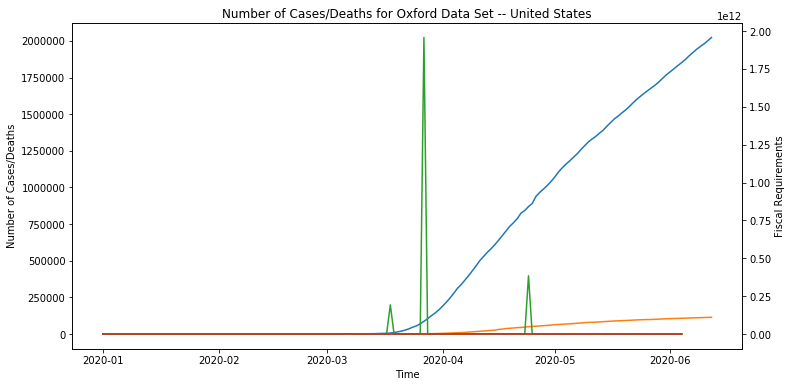

In [107]:
country_control_df = country_df.loc[:, fiscal_flags + key_metrics]
handles = []

fig, ax1 = plt.subplots(figsize=(12,6))

handles.append(ax1.plot('Date', 'ConfirmedCases', data = country_df, label='ConfirmedCases'))
handles.append(ax1.plot('Date', 'ConfirmedDeaths', data = country_df, label='ConfirmedDeaths'))
ax2 = ax1.twinx()

for req in fiscal_flags:
    handles.append(ax2.plot('Date', req, data = country_control_df, label=req))

ax1.set_xlabel('Time')
ax1.set_ylabel('Number of Cases/Deaths')
ax2.set_ylabel('Fiscal Requirements')
plt.title('Number of Cases/Deaths for Oxford Data Set -- {}'.format(selected_country))
# plt.legend(handles=handles)

plt.show()

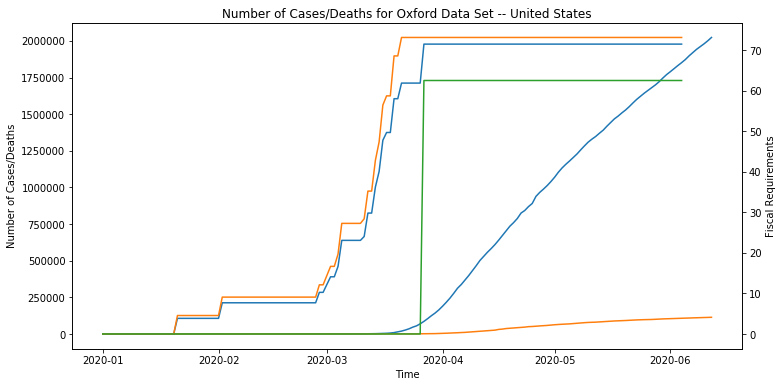

In [108]:
country_control_df = country_df.loc[:, display_index + key_metrics]
handles = []

fig, ax1 = plt.subplots(figsize=(12,6))

handles.append(ax1.plot('Date', 'ConfirmedCases', data = country_df, label='ConfirmedCases'))
handles.append(ax1.plot('Date', 'ConfirmedDeaths', data = country_df, label='ConfirmedDeaths'))
ax2 = ax1.twinx()

for req in display_index:
    handles.append(ax2.plot('Date', req, data = country_control_df, label=req))

ax1.set_xlabel('Time')
ax1.set_ylabel('Number of Cases/Deaths')
ax2.set_ylabel('Fiscal Requirements')
plt.title('Number of Cases/Deaths for Oxford Data Set -- {}'.format(selected_country))
# plt.legend(handles=handles)

plt.show()

In [109]:
ordinal_columns = ['C1_School closing', 'C2_Workplace closing', 'C3_Cancel public events', 'C4_Restrictions on gatherings', 'C5_Close public transport', 'C6_Stay at home requirements', 'C7_Restrictions on internal movement', 'C8_International travel controls', 'E1_Income support', 'E2_Debt/contract relief', 'H1_Public information campaigns', 'H2_Testing policy', 'H3_Contact tracing']
continuos_columns = ['E3_Fiscal measures', 'E4_International support', 'H4_Emergency investment in healthcare', 'H5_Investment in vaccines']
key_metrics = ['CountryName', 'Date', 'ConfirmedCases', 'NewConfirmedCases', 'ConfirmedDeaths', 'NewConfirmedDeaths']

In [117]:
ordinal_df = df.loc[:, key_metrics + ordinal_columns + display_index]
continious_df = df.loc[:, continuos_columns + key_metrics]

In [118]:
ordinal_df.head()

,CountryName,Date,ConfirmedCases,NewConfirmedCases,ConfirmedDeaths,NewConfirmedDeaths,C1_School closing,C2_Workplace closing,C3_Cancel public events,C4_Restrictions on gatherings,C5_Close public transport,C6_Stay at home requirements,C7_Restrictions on internal movement,C8_International travel controls,E1_Income support,E2_Debt/contract relief,H1_Public information campaigns,H2_Testing policy,H3_Contact tracing,GovernmentResponseIndex,ContainmentHealthIndex,EconomicSupportIndex
0,Afghanistan,2020-01-01,0,NaN,0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Afghanistan,2020-01-02,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Afghanistan,2020-01-03,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Afghanistan,2020-01-04,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Afghanistan,2020-01-05,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [119]:
country_1 = 'India'
country_2 = 'United States'

# ordinal_df_country_1 = ordinal_df.loc[ordinal_df['CountryName'] == country_1]
# ordinal_df_country_2 = ordinal_df.loc[ordinal_df['CountryName'] == country_2]

In [120]:
ordinal_country_agg_df = ordinal_df.groupby(['CountryName'])[ordinal_columns].agg('sum')
ordinal_country_agg_df

,C1_School closing,C2_Workplace closing,C3_Cancel public events,C4_Restrictions on gatherings,C5_Close public transport,C6_Stay at home requirements,C7_Restrictions on internal movement,C8_International travel controls,E1_Income support,E2_Debt/contract relief,H1_Public information campaigns,H2_Testing policy,H3_Contact tracing
CountryName,,,,,,,,,,,,,
Afghanistan,261.0,231.0,200.0,260.0,146.0,152.0,134.0,321.0,0.0,0.0,200.0,107.0,106.0
Albania,246.0,172.0,176.0,272.0,168.0,160.0,160.0,339.0,119.0,87.0,199.0,124.0,99.0
Algeria,276.0,187.0,188.0,296.0,162.0,194.0,162.0,359.0,60.0,69.0,158.0,0.0,0.0
Andorra,231.0,217.0,91.0,0.0,79.0,91.0,0.0,141.0,182.0,68.0,158.0,212.0,66.0
Angola,219.0,167.0,140.0,258.0,97.0,130.0,140.0,413.0,0.0,114.0,92.0,165.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,267.0,256.0,186.0,300.0,11.0,184.0,173.0,366.0,0.0,166.0,212.0,196.0,0.0
Vietnam,288.0,170.0,236.0,228.0,97.0,42.0,226.0,459.0,57.0,0.0,256.0,306.0,209.0
Yemen,258.0,100.0,168.0,0.0,0.0,55.0,80.0,328.0,0.0,0.0,80.0,0.0,0.0


In [121]:
# list((ordinal_country_agg_df.loc[ordinal_df['CountryName'] == country_1]).iloc[0, :])

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r = list(ordinal_country_agg_df.loc[country_1, :]),
      theta = list(ordinal_country_agg_df.columns),
      fill = 'toself',
      name = country_1
))

fig.add_trace(go.Scatterpolar(
      r = list(ordinal_country_agg_df.loc[country_2, :]),
      theta = list(ordinal_country_agg_df.columns),
      fill = 'toself',
      name = country_2
))

fig.update_layout(
  polar = dict(
    radialaxis = dict(
      visible = True
    ),
  ),
  showlegend = True,
  title=dict(text = "Policy Comparison")
)

fig.show()

In [129]:
ordinal_country_date_agg_df = ordinal_df.groupby(['CountryName', 'Date'])[key_metrics + display_index].agg('sum')
dates = list(ordinal_country_date_agg_df.index.get_level_values(1))

# Initialize figure with subplots
fig = make_subplots(rows=2, cols=1, 
                    specs=[[{'type': 'polar'}], [{"secondary_y": True}]],
                    subplot_titles=("Policy Comparions", "Policy Effect on Cases and Deaths")
               )

fig.add_trace(go.Scatterpolar(
        r = list(ordinal_country_agg_df.loc[country_1, :]),
        theta = list(ordinal_country_agg_df.columns),
        fill = 'toself',
        name = country_1
    ),
    1, 
    1
)

fig.add_trace(go.Scatterpolar(
        r = list(ordinal_country_agg_df.loc[country_2, :]),
        theta = list(ordinal_country_agg_df.columns),
        fill = 'toself',
        name = country_2,
    ),
    1, 
    1,
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_1, :], :]['NewConfirmedCases']),
        name=country_1 + " - Confirmed Cases",
    ),
    2, 
    1
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_2, :], :]['NewConfirmedCases']),
        name=country_2 + " - Confirmed Cases"
    ),
    2, 
    1
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_1, :], :]['GovernmentResponseIndex']),
        name=country_1 + " - GovernmentResponseIndex",
    ),
    2, 
    1,
    secondary_y=True
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_1, :], :]['ContainmentHealthIndex']),
        name=country_1 + " - ContainmentHealthIndex",
    ),
    2, 
    1,
    secondary_y=True
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_1, :], :]['EconomicSupportIndex']),
        name=country_1 + " - EconomicSupportIndex",
    ),
    2, 
    1,
    secondary_y=True
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_1, :], :]['NewConfirmedDeaths']),
        name=country_1 + " - Confirmed Deaths"
    ),
    2, 
    1
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_2, :], :]['NewConfirmedDeaths']),
        name=country_2 + "- Confirmed Deaths"
    ),
    2, 
    1
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_2, :], :]['GovernmentResponseIndex']),
        name=country_2 + " - GovernmentResponseIndex",
    ),
    2, 
    1,
    secondary_y=True
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_2, :], :]['ContainmentHealthIndex']),
        name=country_2 + " - ContainmentHealthIndex",
    ),
    2, 
    1,
    secondary_y=True
)

fig.add_trace(go.Scatter(
        x=dates,
        y=list(ordinal_country_date_agg_df.loc[pd.IndexSlice[country_2, :], :]['EconomicSupportIndex']),
        name=country_2 + " - EconomicSupportIndex",
    ),
    2, 
    1,
    secondary_y=True
)


fig.update_layout(height=800, width=1000, title_text="Comparison of Policies and Cases")
fig.update_yaxes(title_text="Number of Cases/Deaths", row=2, col=1)
fig.update_yaxes(title_text="Policy Metric", row=2, col=1, secondary_y=True)
fig.update_xaxes(title_text="Date", row=2, col=1)


fig.show()